Olá! Este é um projeto de Ciência de Dados desenvolvido por mim (https://www.linkedin.com/in/leonardomendesantero) com o objetivo de demonstrar meus estudos em Machine Learning aplicados a um problema crítico no mercado: o Customer Churn, ou taxa de evasão de clientes.

Te convido a visitar o artigo que escrevi no medium no qual conto sobre o processo de desenvolvimento desse projeto (https://medium.com/@leoantero/what-a-15x-churn-difference-taught-me-about-business-and-data-science-1b6483c15b56) e também o meu github que é onde eu guardo todos os projetos que eu já fiz (https://github.com/leoantero)

Como o sucesso de toda empresa depende da sua base de clientes, este tópico é de extrema relevância pois a rotatividade impacta diretamente a receita. Um churn elevado pode indicar falhas no serviço, insatisfação com o produto ou lacunas na gestão.

Além disso, reter clientes é estrategicamente mais barato do que conquistar novos: atrair um novo cliente pode custar até 5x mais do que manter um atual, e aumentar a retenção em apenas 5% pode aumentar os lucros em até 95%, segundo estudos da Invesp.

Neste projeto, busco identificar os motivos pelos quais os clientes optam por sair ou permanecer, além de desenvolver um modelo para prever possíveis desistências.

Para avaliar os modelos, serão usadas métricas como Precisão, Recall, F1 Score, ROC AUC
  - Precisão irá dizer quanto dos clientes que o modelo preveu que iam sair realmente saíram.
  - Recall mede quantos clientes saíram e o modelo conseguiu prever.
  - F1 combina Recall e Acurácia e dá um resultado equilibrado entre os dois.
  - ROC AUC (Área abaixo da curva) mede o quão bem o modelo consegue distinguir os clientes que saíram e os que não saíram, quanto mais próximo de 1 melhor.

No contexto empresarial de Churn, é comum que ofertas sejam direcionadas para clientes que são propensos a saírem da empresa. Ao aumentar o Recall, o envio dessas ofertas para pessoas que na verdade não iriam sair aumenta, enquanto caso aumentemos a precisão podemos deixar o modelo rígido demais e perder clientes que poderiam ter sido identificados.

***(Um adendo, acho importante ressaltar do trade off existente entre precisão e recall, enquanto um restringe mais o modelo o outro deixa os resultados mais generalistas)***

Por esse motivo, nesse problema em específico, irei avaliar os modelos focando principalmente em aumentar o Recall (mas claro, também garantindo que as outras métricas estejam satisfatórias), para assegurar que vamos maximizar a identificação de Churn.

# Dataset

O Conjunto de dados que está sendo utilizado é o ['Telco Customer Churn'](https://www.kaggle.com/datasets/blastchar/telco-customer-churn?phase=FinishSSORegistration&returnUrl=%2Fdatasets%2Fblastchar%2Ftelco-customer-churn%2Fversions%2F1%3Fresource%3Ddownload&SSORegistrationToken=CfDJ8KfhQMrVil5MrZ6RWpmB4eFwp2I3EEX34910BfbEY84xCw1bYGML_BhictB42rn9xJgYMD6bTWnI2UcZfEHUG1ahM1CJcHOXDQgb0M39V9eP6Im2ExdI4QBxZGqKJFn5EkRLz3AQAqwdQhmFLv9wcepPOOf04b1jvzW4neTDUHtizgfvFgOo4XskbzeRufK1TxuJAgm5rTO70fo91bFHNbZ6sC81pwyqpr4sK0zq8EjYpdXnWlH0DaTRJjeKPZmLLRj_Q7plUCMZh_qSgwk_EfRUt7_4xMd1i9ebdygxM4dfEzazLghXhEoIBodRp5qMgmTCY8Gt0SvgL32cZER6hxk&DisplayName=Leo) (disponível no link do kaggle)

Cada linha representa um cliente (instâncias) e cada coluna representa uma determinada característica (features).

In [1]:
# Primeiro, vamos extrair os dados e salvar em um dataframe para facilitar sua manipulação, para isso usaremos a biblioteca pandas
import pandas as pd

df = pd.read_csv('drive/MyDrive/ChurnDataset.csv')

# Análise Exploratória de Dados

Antes de começar qualquer tipo de treinamento, é necessário fazer uma análise exploratória dos dados, o que inclui avaliar os dados, sua estrutura, se estão limpos, etc.

Essa etapa é muito importante pois dados sujos são inadequados para modelos e poluem análises, o que pode levar a insights equivocados.

A função .head() é retorna as 5 primeiras linhas do dataset, isso é útil para ter uma visão inicial dos dados.

In [2]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


df.info() mostra todas as features do conjunto de dados, esse dataset é bem completo então temos muitas informações. Além disso também é possível notar quais features são numéricas, quantos valores nulos cada uma tem, e o formato do dataset, 7043x21.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


df.describe() faz um resumo estatístico das features numéricas, que nesse caso, são 3.

In [4]:
df.describe()


,SeniorCitizen,tenure,MonthlyCharges
count,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692
std,0.368612,24.559481,30.090047
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.500000
50%,0.000000,29.000000,70.350000
75%,0.000000,55.000000,89.850000
max,1.000000,72.000000,118.750000


In [5]:
df['TotalCharges'].value_counts()

,count
TotalCharges,
,11
20.2,11
19.75,9
20.05,8
19.9,8
...,...
130.15,1
3211.9,1
7843.55,1


In [6]:
df[df['TotalCharges']==' ']

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,No


Na variável MonthlyCharges por exemplo existem vários valores nulos, ao identificar essas linhas é possível notar que todos esses clientes provavelmente são clientes recentes que entraram agora, visto que todos tem tenure = 0.

Tendo isso em mente, irei adicionar 0 no lugar do nulo.

In [7]:
df['TotalCharges'] = df['TotalCharges'].replace({' ':'0.0'})

df['TotalCharges'] = df['TotalCharges'].astype(float) # Passando TotalCharges para um valor numérico, já que no dataset está como object

df = df.drop(columns=['customerID']) # Também removendo essa coluna pois ela não é útil nas análises

## Sobre os dados e suas distribuições:
  
  
  Analisando as variáveis numéricas:

  - *Tenure* representa o número de meses que o cliente está com a empresa. O gráfico mostra que existem muitos clientes com 0 meses e com 70+ meses, isso indica que além da empresa estar atraindo novas pessoas, clientes de longa data se mantêm fiéis. Porém visto que após o primeiro mês mais de 50% dos clientes não permanecem, podemos melhorar isso buscando alternativas de maximizar essa conversão e trabalhar na permanência de clientes, buscando entender melhor o que pode causa essa taxa de desistência após o primeiro mês.


  - *Monthly Charges* é o valor que o cliente paga, esse valor pode variar conforme os produtos da empresa, porém é possível notar que existe uma grande concentração no plano mais barato.



  - *SeniorCitizen* (Cidadão idoso) é uma variável binária que pode assumir 2 valores, 0 ou 1, 0 indicando ausência e 1 indicando presença, aqui 0 significa que o cliente não é idoso e 1 significa que ele é. É perceptível no gráfico abaixo que clientes idosos são minoria.

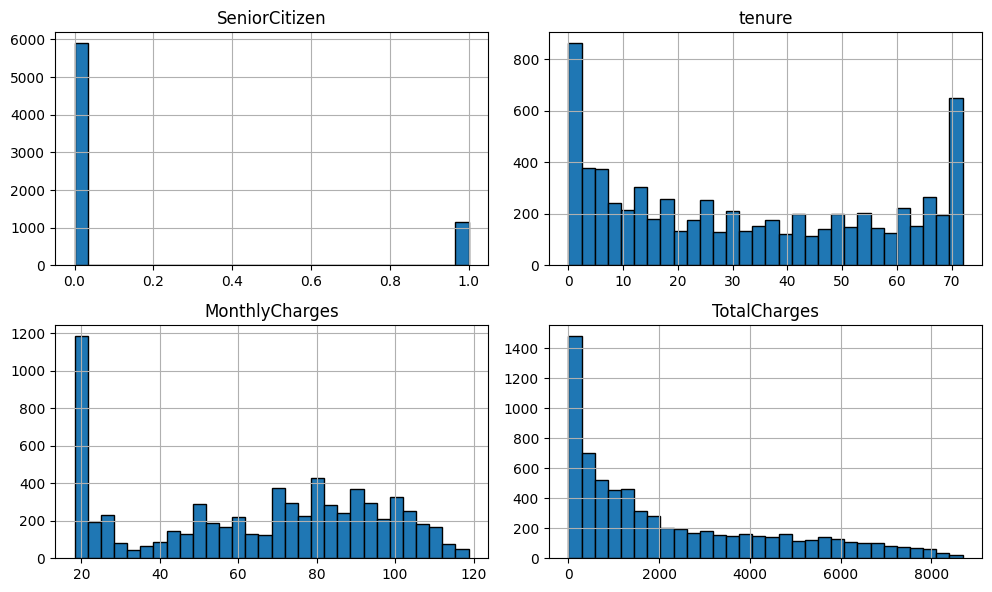

In [8]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

numeric_cols = df.select_dtypes(include=[np.number])

df.hist(bins=30, figsize=(10,6), grid=True, edgecolor='black')
plt.tight_layout(pad=1.0)
plt.show()

De acordo com esses gráficos é possível extrair informações interessantes:

- Perfil Etário: A grande maioria dos clientes não é idosa (SeniorCitizen próximo de 0).

- Fidelidade (Tenure): Existe uma discrepância no tempo de casa, há um volume alto de novos clientes e de clientes muito antigos.

- Gastos:
  - Mensais: O maior pico de frequência ocorre em valores baixos, próximos a $20.

  - Totalidade: A variável TotalCharges apresenta uma distribuição que se assemelha à Heavy-tailed (uma definição que caracteriza distribuições que decrescem rapidamente e se extendem mais a direita da mediana do que a esquerda), confirmando que a maior parte da base gerou uma receita total acumulada menor até o momento. Features com essa distribuição podem atrapalhar alguns modelos de machine learning, por isso posteriormente irei aplicar métodos que façam a distribuição dessa variável se aproximar da distribuição normal (bell-shaped)

<Axes: xlabel='SeniorCitizen'>

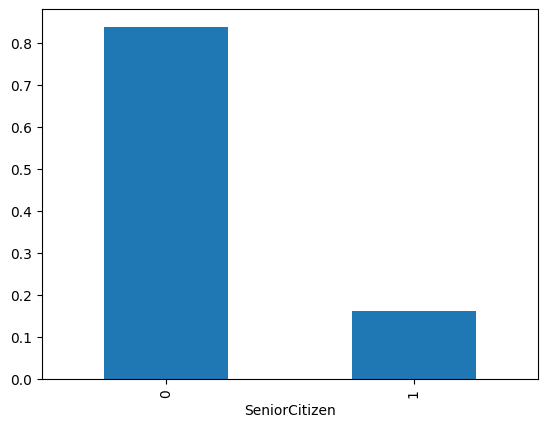

In [9]:
df['SeniorCitizen'].value_counts(normalize=True).plot(kind='bar')

# Apenas cerca de 20% dos clientes são idosos

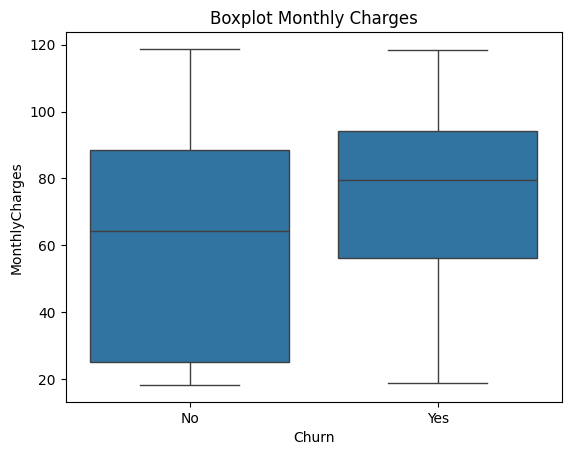

In [10]:
sns.boxplot(x='Churn', y='MonthlyCharges', data=df)
plt.title('Boxplot Monthly Charges')
plt.show()

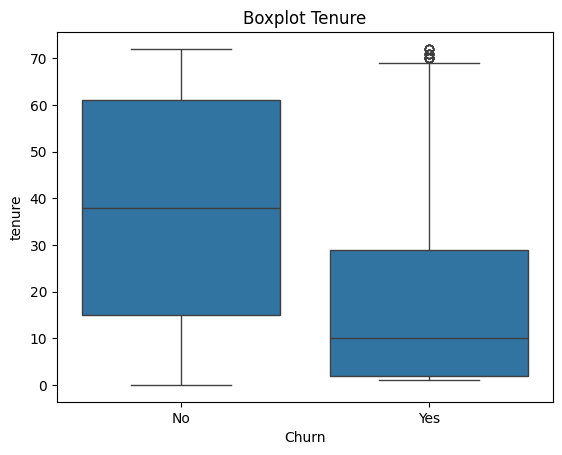

In [11]:
sns.boxplot(x='Churn', y='tenure', data=df)
plt.title('Boxplot Tenure')
plt.show()

O Boxplot também é muito interessante para analisar a distribuição dos dados, além de visualmente exibir os quartis e a mediana, com ele também é possível identificar possíveis outliers e extrair insights sobre o relacionamento entre variáveis.

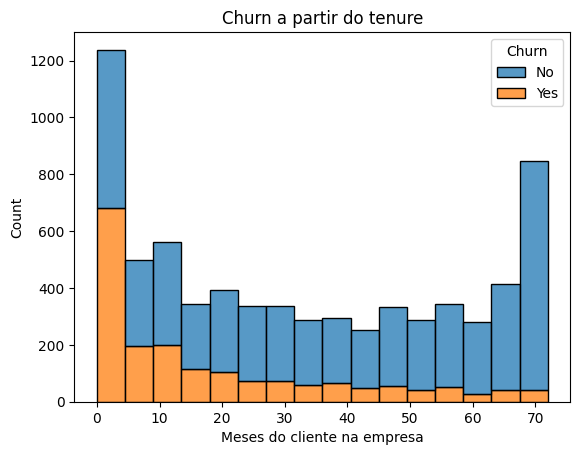

In [12]:
plt.figsize=(8,5)
sns.histplot(data=df, x='tenure', hue='Churn', multiple='stack')
plt.title('Churn a partir do tenure', fontsize=12)
plt.xlabel('Meses do cliente na empresa')
plt.show()

Como já era de se esperar o churn é bem alto nos primeiros meses e vai diminuindo conforme o cliente passa mais tempo na empresa.

Ao analisar o boxplot é possível notar que 50% dos clientes saem por volta dos 10 primeiros meses e 75% dos saem antes de 30 meses.

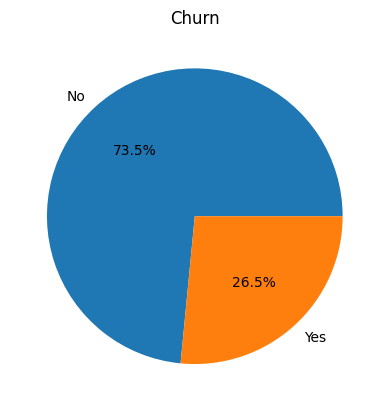

In [13]:
plt.pie(df['Churn'].value_counts(), labels=df['Churn'].unique(), autopct='%1.1f%%')
plt.title('Churn')
plt.show()

Esse gráfico de pizza mostra que cerca de 3/4 dos clientes optam por permanecer.

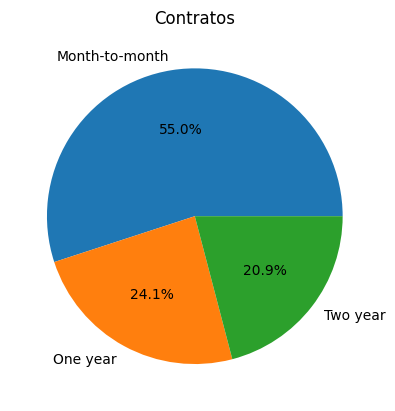

In [14]:
plt.pie(df['Contract'].value_counts(), labels=df['Contract'].unique(), autopct='%1.1f%%')
plt.title('Contratos')
plt.show()

A maioria dos contratos são mensais, representando 55% do total, os outros 45% são contratos de 1 ano ou mais.

Agora irei plotar a distribuição das variáveis numéricas do dataset.

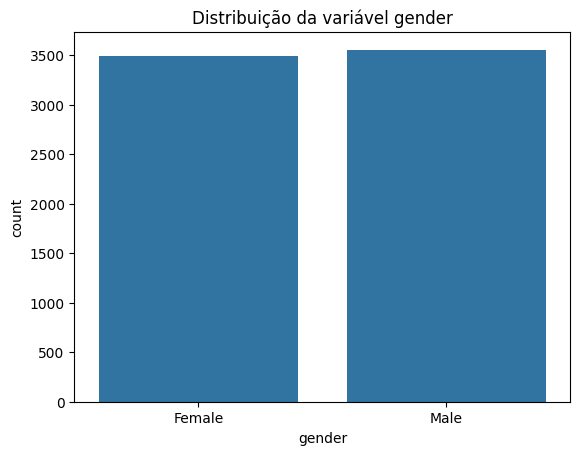

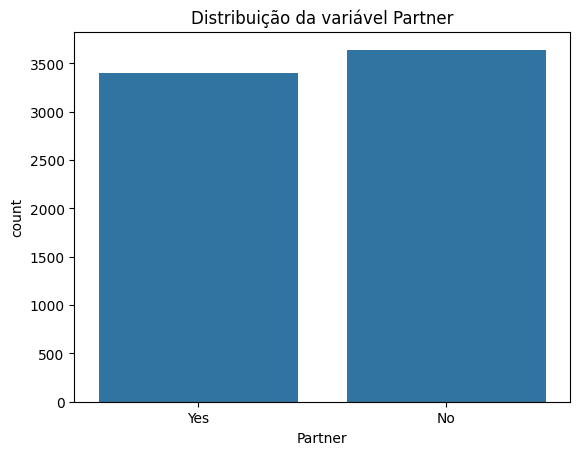

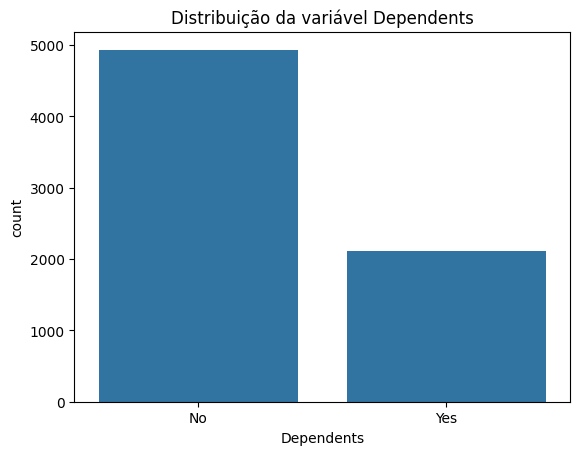

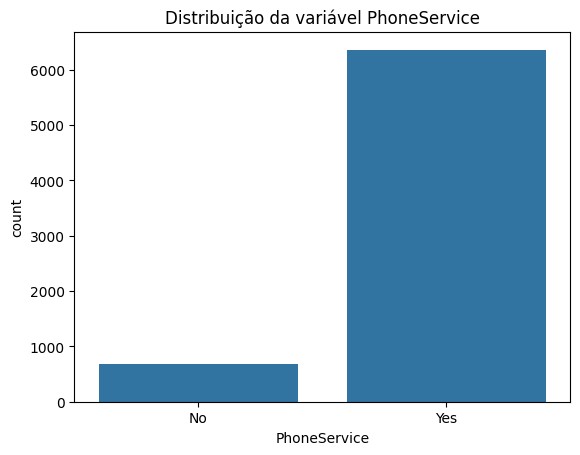

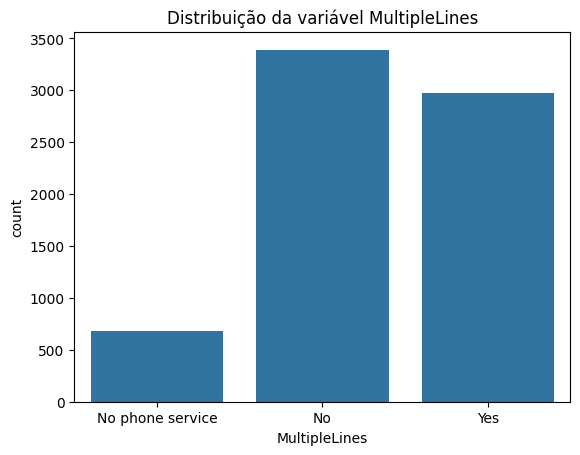

...

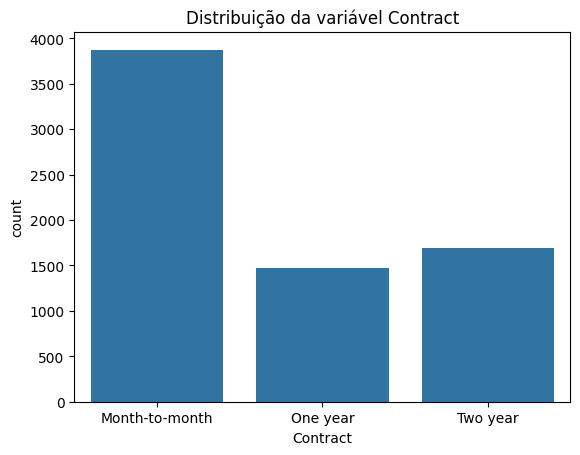

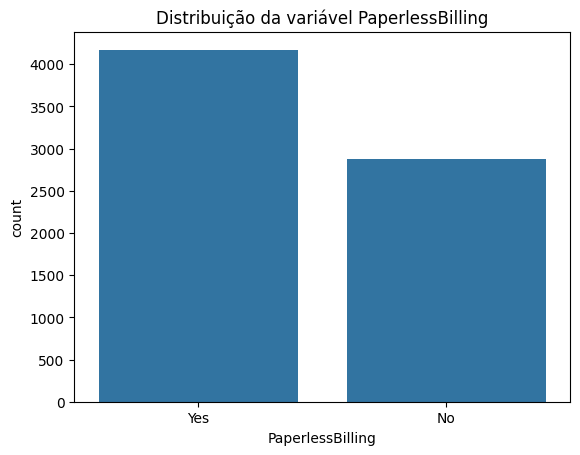

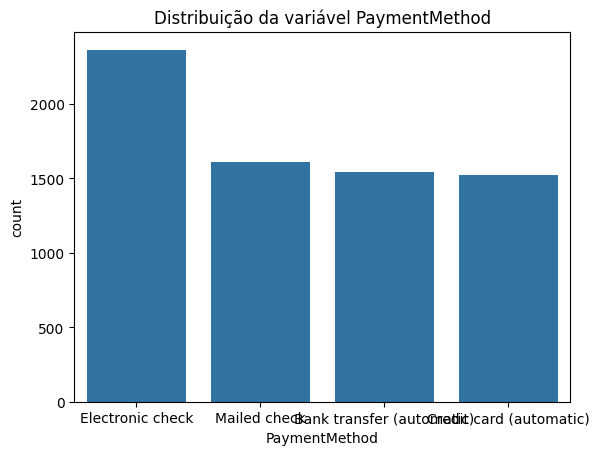

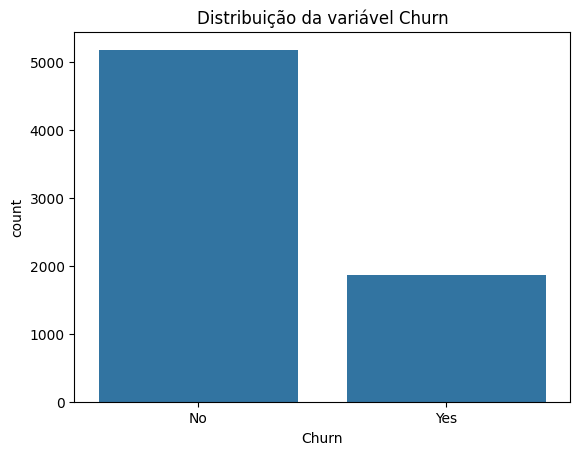

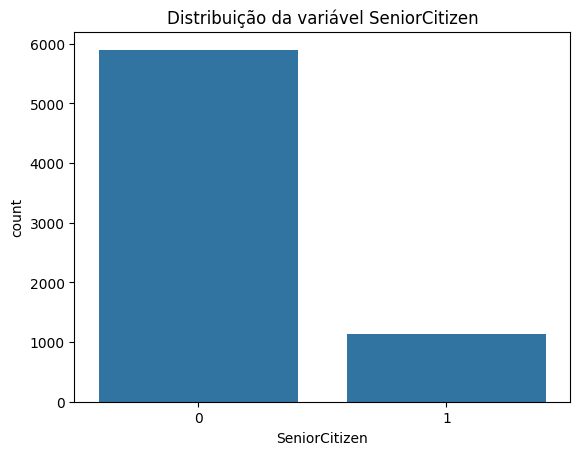

In [15]:
categ_cols = df.select_dtypes(include=['object']).columns.tolist() + ['SeniorCitizen']
for col in categ_cols:
  plt.figsize=(5,3)
  sns.countplot(x=df[col])
  plt.title(f'Distribuição da variável {col}')
  plt.show()

Estes gráficos das variáveis categóricas mostram sua distribuição, é evidente que algumas classes são desbalanceadas como 'SeniorCitizen', 'PhoneService' e a prórpia 'Churn'.

In [16]:
pd.crosstab(df['Contract'], df['Churn'], normalize='index')


Churn,No,Yes
Contract,,
Month-to-month,0.572903,0.427097
One year,0.887305,0.112695
Two year,0.971681,0.028319


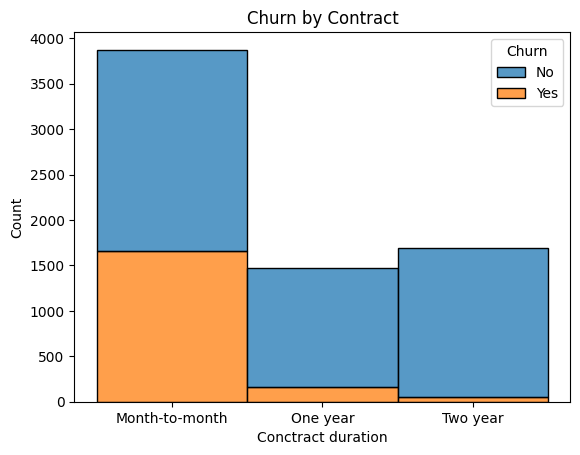

In [17]:
sns.histplot(data = df, x='Contract', hue = 'Churn', multiple='stack')
plt.title('Churn by Contract', fontsize=12)
plt.xlabel('Conctract duration')
plt.show()

In [18]:
taxa_churn_mensal_2year = (
    df[df['Contract'] == 'Month-to-month']['Churn'].eq('Yes').mean()
    /
    df[df['Contract'] == 'One year']['Churn'].eq('Yes').mean()
)

print(taxa_churn_mensal_2year)

3.7898406529343185


Este histograma ilustra bem como contratos mensais podem estar relacionados a saída de um cliente, visto que o contrato mensal tem 42% de churn enquanto o anual tem 11%. Uma das alternativas é que um cliente que já não está satisfeito com a empresa ou que ainda não a conheçe provavelmente irá optar por um contrato mais curto.

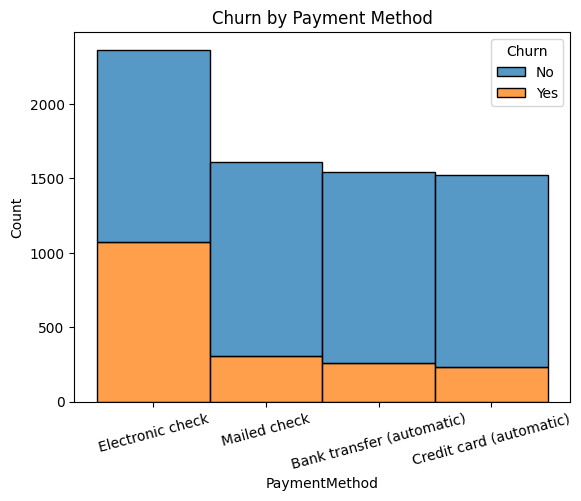

In [19]:
sns.histplot(data=df, x='PaymentMethod', hue='Churn', multiple='stack')
plt.title('Churn by Payment Method', fontsize=12)
plt.xlabel('PaymentMethod')
plt.tick_params(axis='x', rotation=15)
plt.show()

De maneira similar é perceptível um comportamento parecido nos métodos de pagamento, boa parte dos usuários de Eletronic check (uma espécie de cheque digital que desconta o valor na sua conta) saíram da empresa, enquanto nos outros métodos de pagamento essa taxa é bem menor.

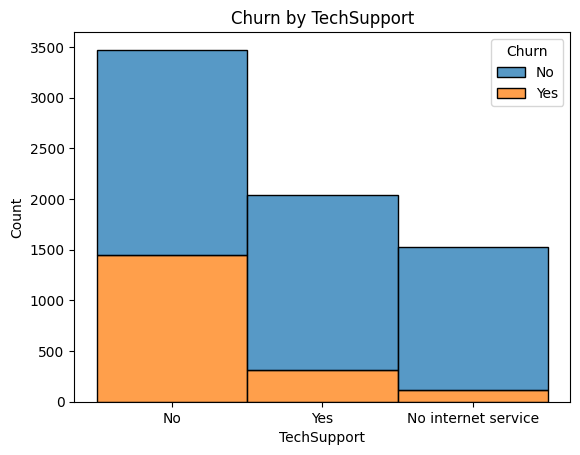

In [20]:
sns.histplot(data=df, x='TechSupport', hue='Churn', multiple='stack')
plt.title('Churn by TechSupport')
plt.show()

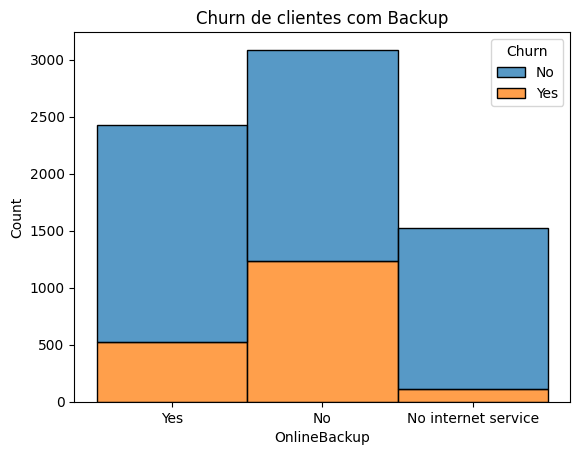

In [21]:
sns.histplot(data=df, x='OnlineBackup', hue='Churn', multiple='stack')
plt.title('Churn de clientes com Backup')
plt.show()

Estes mostram que talvez um bom indicativo para manter os clientes seja oferecer serviços como suporte técnico e backup.

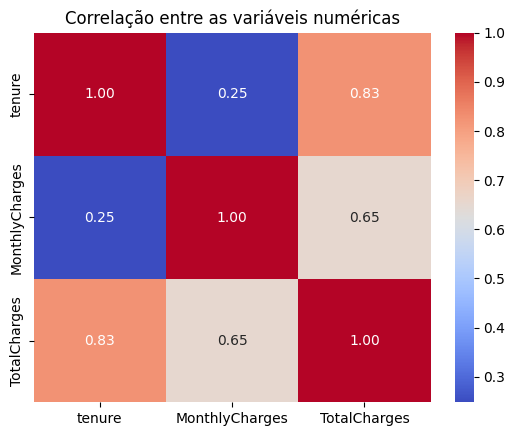

In [22]:
sns.heatmap(df[['tenure', 'MonthlyCharges', 'TotalCharges']].corr(), annot=True, cmap='coolwarm', fmt = '.2f')
plt.title('Correlação entre as variáveis numéricas')
plt.show()

Esse gráfico mostra a correlação entre as variáveis numéricas, é perceptível uma forte correlação entre 'tenure' e 'TotalCharges', que é explicado pelo fato de que o cliente gasta mais ao acumular tempo na empresa.

# Iniciando preparatórios para aplicar os modelos

Agora que já temos uma boa noção dos dados presentes, vamos começar a trabalhar os dados para o modelo os receber.

Todos sabemos que a ansiedade para testar modelos é grande! Porém antes é necessário seguir algumas etapas para garantir que o resultado gere resultados consistentes.


Antes de tudo, vamos dividir o dataset. A coluna alvo (que queremos prever) será adicionada a uma nova variável e será excluída no outro grupo de dados.

Estou utilizando aqui o train_test_split da biblioteca sklearn. Precisamos dividir os dados em treino e teste para que o modelo seja treinado com uma parte do dataset e seja validado com outra parte, assim conseguimos ter uma visão mais clara sobre sua perfomance e garantimos que ele não decorou os dados de treino.


In [23]:
from sklearn.model_selection import train_test_split


X = df.drop(columns=['Churn'])
y = df['Churn']

# Também vou passar o y_train para numérico já que alguns modelos não lidam bem com features categóricas e como é a featrure alvo o pipeline não passa por ela
y = y.replace({'Yes' : 1, 'No' : 0})

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3, # 30% dos dados serão destinados ao teste e 70% para o treinamento
    random_state=42,
    stratify = y # Stratify utilizado pois a feature 'Churn' é levemente desbalanceada, apenas cerca de 25% dos dados são positivos para o churn
)

/tmp/ipython-input-2449716718.py:8: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  y = y.replace({'Yes' : 1, 'No' : 0})


In [24]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_predict
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, classification_report
from sklearn.impute import SimpleImputer
import pandas as pd

num_features = X_train.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_features = X_train.select_dtypes(include=['object']).columns.tolist()
skewed_features = ['TotalCharges']

# Pipeline para a variável irregular
skewed_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('power_transformer', PowerTransformer(method='yeo-johnson'))
])

# Como as variáveis numéricas tem um tratamento diferente das variáveis categóricas fiz dois pipelines distintos

# Pipeline das variáveis numéricas
num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')), # Usando mediana pois ela é menos sensível a outliers, que são frequentes em ambientes financeiros
    ('scaler', StandardScaler()) # StandardScaler para o caso dos dados estaram em escalas diferentes
])

# Pipeline das variáveis categóricas
cat_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OneHotEncoder(handle_unknown='ignore'))
])

# Unindo os pipelines das colunas
columns_pipe = ColumnTransformer([
    ('skew', skewed_pipeline, skewed_features),
    ('num', num_pipeline, num_features),
    ('cat', cat_pipeline, cat_features),
])


Pipelines e Columns Transformers são muito importantes no contexto de ciência de dados pois eles garantem a integridade dos dados que estão chegando continuamente no modelo.

Por esse motivo utilizei:
- O SimpleImputer para lidar com dados faltantes.
- StandardScaler para lidar com desbalanceamento.
- OnehotEncoder para transformar as variáveis categóricas de maneira que o modelo consiga extrair informações.

### Teste com Regressão logística

A regressão logística é o modelo mais clássico utilizado em tarefas de classificação, no qual para fazer as predições a função sigmoide é aplicada.

In [25]:
# Modelo Básico para iniciar

# Gerando o pipeline final com o modelo
log_reg_model = Pipeline([
    ('columns', columns_pipe),
    ('log_reg', LogisticRegression(random_state=42))
])

log_reg_model.fit(X_train, y_train)

y_pred = log_reg_model.predict(X_test)
y_proba = log_reg_model.predict_proba(X_test)[:,1]
print('\n' + '=' * 50)
print('Logistic Regression Model')
print('=' * 50)
print(classification_report(y_test, y_pred))
print(f'ROC AUC: {roc_auc_score(y_test, y_proba):.4f}')


Logistic Regression Model
              precision    recall  f1-score   support

           0       0.84      0.91      0.87      1552
           1       0.68      0.53      0.59       561

    accuracy                           0.81      2113
   macro avg       0.76      0.72      0.73      2113
weighted avg       0.80      0.81      0.80      2113

ROC AUC: 0.8485


Para um modelo inicial esses valores estão bons, mas ainda podem ser melhorados.

Além da regressão logística também vou testar outros modelos também para avaliar qual tem melhores resultados.


In [26]:
lr_balanced_model = Pipeline([
    ('columns', columns_pipe),
    ('log_reg', LogisticRegression(class_weight='balanced', random_state=42))
])
lr_balanced_model.fit(X_train, y_train)

y_lr_balanced_pred = lr_balanced_model.predict(X_test)
y_lr_balanced_proba = lr_balanced_model.predict_proba(X_test)[:,1]
print('\n' + '=' * 50)
print('Logistic Regression Model with class_weight = balanced')
print('=' * 50)
print(classification_report(y_test, y_lr_balanced_pred))
print(f'ROC AUC: {roc_auc_score(y_test, y_lr_balanced_proba):.4f}')


Logistic Regression Model with class_weight = balanced
              precision    recall  f1-score   support

           0       0.91      0.73      0.81      1552
           1       0.51      0.80      0.63       561

    accuracy                           0.75      2113
   macro avg       0.71      0.76      0.72      2113
weighted avg       0.80      0.75      0.76      2113

ROC AUC: 0.8481


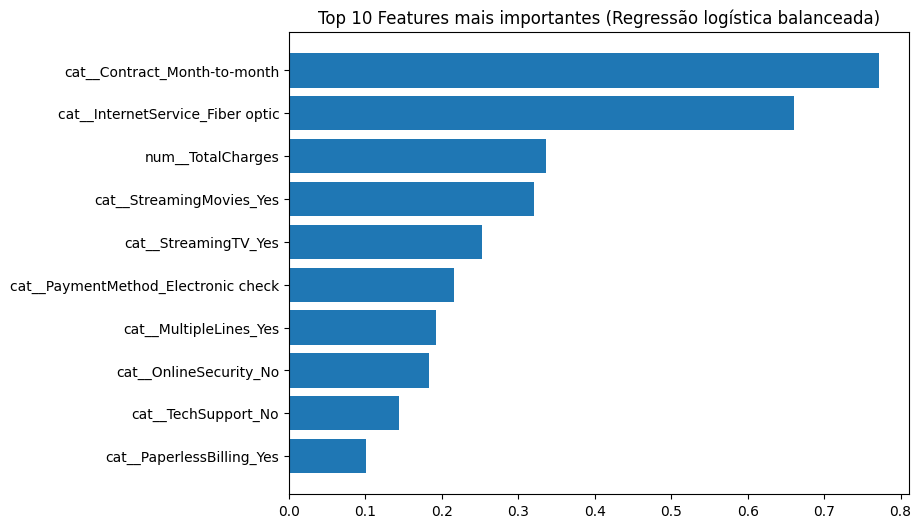

In [27]:
model_lr = lr_balanced_model.named_steps['log_reg']
preprocessor_lr = lr_balanced_model.named_steps['columns']

coefs_lr = model_lr.coef_[0]
feature_names_lr = preprocessor_lr.get_feature_names_out()

coef_lr_df = pd.DataFrame({
    'feature': feature_names_lr,
    'importance': coefs_lr
})

coef_lr_df = coef_lr_df.sort_values(by='importance', ascending=False)

top10_lr = coef_lr_df.head(10)

plt.figure(figsize=(8, 6))
plt.barh(top10_lr['feature'], top10_lr['importance'])
plt.gca().invert_yaxis()
plt.title('Top 10 Features mais importantes (Regressão logística balanceada)')
plt.show()

Adicionando o hiperparâmetro class_weight='balanced' o desempenho do recall melhorou bastante!

De 56% para 80%, aumento de aproximadamente **43%**


Como já era de se esperar pela disparidade na quantidade de dados, alguns modelos sofreriam no balanceamento dos dados.

# Mais modelos
Agora irei testar outros modelos difrentes que buscam refletir a complexidade das ações humanas, apesar da regressão logística ser um bom modelo de classificação talvez ela ainda não consiga capturar todos os nuances dos dados por ser um modelo baseado em relações lineares.

Irei testar o Random Forest e o XGBoost, que são modelos de árvores de decisão e de ensemble. Os dois modelos são bem robustos e conseguem trabalhar bem com desbalanceamento de classes.

In [28]:
from sklearn.ensemble import RandomForestClassifier

rf_model = Pipeline([
    ('columns', columns_pipe),
    ('random_forest', RandomForestClassifier(random_state=42))
])

rf_model.fit(X_train, y_train)
y_rf_pred = rf_model.predict(X_test)
y_rf_proba = rf_model.predict_proba(X_test)[:,1]
print(classification_report(y_test, y_rf_pred))
print(f'ROC AUC: {roc_auc_score(y_test, y_rf_proba):.4f}')

              precision    recall  f1-score   support

           0       0.83      0.89      0.86      1552
           1       0.62      0.48      0.54       561

    accuracy                           0.78      2113
   macro avg       0.72      0.69      0.70      2113
weighted avg       0.77      0.78      0.77      2113

ROC AUC: 0.8180


Primariamente os resultados do RandomForest não foram tão agradáveis quanto os resultados da Regressão Logística, imagino que possa ser por causa do desbalanceamento da variável alvo, por isso irei utilizar a técnica SMOTE.

A técnica SMOTE gera dados sintéticos com base nos dados disponíveis.

In [29]:
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

rf_smote_model = Pipeline([
    ('columns', columns_pipe),
    ('smote', SMOTE(random_state=42)),
    ('random_forest', RandomForestClassifier(random_state=42, max_depth = 10))
])

rf_smote_model.fit(X_train, y_train)
y_rf_smote_pred = rf_smote_model.predict(X_test)
y_rf_smote_proba = rf_smote_model.predict_proba(X_test)[:,1]
print(classification_report(y_test, y_rf_smote_pred))
print(f'ROC AUC {roc_auc_score(y_test, y_rf_smote_proba):.4f}')

              precision    recall  f1-score   support

           0       0.88      0.81      0.84      1552
           1       0.57      0.69      0.62       561

    accuracy                           0.78      2113
   macro avg       0.72      0.75      0.73      2113
weighted avg       0.80      0.78      0.78      2113

ROC AUC 0.8371


In [30]:
rf_cl_model = Pipeline([
    ('columns', columns_pipe),
    ('random_forest', RandomForestClassifier(random_state=42, class_weight='balanced', max_depth = 10))
])

rf_cl_model.fit(X_train, y_train)
y_rf_cl_pred = rf_cl_model.predict(X_test)
y_rf_cl_proba = rf_cl_model.predict_proba(X_test)[:,1]
print(classification_report(y_test, y_rf_cl_pred))
print(f'ROC AUC {roc_auc_score(y_test, y_rf_cl_proba):.4f}')

              precision    recall  f1-score   support

           0       0.89      0.79      0.84      1552
           1       0.56      0.71      0.63       561

    accuracy                           0.77      2113
   macro avg       0.72      0.75      0.73      2113
weighted avg       0.80      0.77      0.78      2113

ROC AUC 0.8376


As duas técnicas de balanceamento de dados obtiveram resultados semelhantes (mas ainda abaixo) da regressão logística.

Vou testar o optuna para otimização de hiperparametros do random forest e analisar se os resultados são mais expressivos

In [31]:
!pip install optuna
import optuna
from sklearn.model_selection import cross_val_score

def objective_rf(trial):
  hyper_params = {
      'n_estimators': trial.suggest_int('n_estimators', 50, 1000),
      'max_depth': trial.suggest_int('max_depth', 2, 32),
      'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
      'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20)
  }

  rf_model = RandomForestClassifier(
      **hyper_params,
      random_state=42
  )

  pipeline = Pipeline([
      ('columns', columns_pipe),
      ('rf_model', rf_model)
  ])

  score = cross_val_score(pipeline, X_train, y_train, cv = 5, scoring = 'roc_auc')
  return score.mean()

study_rf = optuna.create_study(study_name = 'RandomForest_Churn', direction='maximize')
study_rf.optimize(objective_rf, n_trials = 10, show_progress_bar = True, n_jobs = 1)

best_params = study_rf.best_params
print(f'\nMelhores Hiper parametros Random Forest {best_params}')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 413.9/413.9 kB 7.8 MB/s eta 0:00:00


[I 2026-02-20 00:11:15,460] A new study created in memory with name: RandomForest_Churn


  0%|          | 0/10 [00:00<?, ?it/s]

[I 2026-02-20 00:11:34,325] Trial 0 finished with value: 0.8488126675826265 and parameters: {'n_estimators': 647, 'max_depth': 12, 'min_samples_split': 17, 'min_samples_leaf': 10}. Best is trial 0 with value: 0.8488126675826265.
[I 2026-02-20 00:11:37,931] Trial 1 finished with value: 0.8461377790385001 and parameters: {'n_estimators': 110, 'max_depth': 13, 'min_samples_split': 11, 'min_samples_leaf': 5}. Best is trial 0 with value: 0.8488126675826265.
[I 2026-02-20 00:12:04,293] Trial 2 finished with value: 0.8480806997675844 and parameters: {'n_estimators': 847, 'max_depth': 13, 'min_samples_split': 11, 'min_samples_leaf': 5}. Best is trial 0 with value: 0.8488126675826265.
[I 2026-02-20 00:12:09,422] Trial 3 finished with value: 0.8474685079212121 and parameters: {'n_estimators': 223, 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 9}. Best is trial 0 with value: 0.8488126675826265.
[I 2026-02-20 00:12:35,354] Trial 4 finished with value: 0.8493515742554104 and parameter

In [32]:
rf_optuna_balanced_model = Pipeline([
    ('columns', columns_pipe),
    ('random_forest', RandomForestClassifier(
        class_weight='balanced',
        n_estimators= 465,
        max_depth= 26,
        min_samples_split= 8,
        min_samples_leaf= 20))
])

rf_optuna_balanced_model.fit(X_train, y_train)
y_rf_optuna_balanced_pred = rf_optuna_balanced_model.predict(X_test)
y_rf_optuna_balanced_proba = rf_optuna_balanced_model.predict_proba(X_test)[:,1]
print('\n' + '=' * 50)
print('Random Forest with Optuna and class_weight=balanced')
print('=' * 50)
print(classification_report(y_test, y_rf_optuna_balanced_pred))
print(f'ROC AUC {roc_auc_score(y_test, y_rf_optuna_balanced_proba):.4f}')


Random Forest with Optuna and class_weight=balanced
              precision    recall  f1-score   support

           0       0.91      0.74      0.82      1552
           1       0.53      0.80      0.64       561

    accuracy                           0.76      2113
   macro avg       0.72      0.77      0.73      2113
weighted avg       0.81      0.76      0.77      2113

ROC AUC 0.8446


In [33]:
rf_optuna_model = Pipeline([
    ('columns', columns_pipe),
    ('random_forest', RandomForestClassifier(
        n_estimators= 465,
        max_depth= 26,
        min_samples_split= 8,
        min_samples_leaf= 20))
])

rf_optuna_model.fit(X_train, y_train)
y_rf_optuna_pred = rf_optuna_model.predict(X_test)
y_rf_optuna_proba = rf_optuna_model.predict_proba(X_test)[:,1]
print(classification_report(y_test, y_rf_optuna_pred))
print(f'ROC AUC {roc_auc_score(y_test, y_rf_optuna_proba):.4f}')

              precision    recall  f1-score   support

           0       0.83      0.91      0.87      1552
           1       0.67      0.48      0.56       561

    accuracy                           0.80      2113
   macro avg       0.75      0.70      0.71      2113
weighted avg       0.79      0.80      0.79      2113

ROC AUC 0.8439


Como era de se esperar com o optuna o modelo apresentou resultados melhores

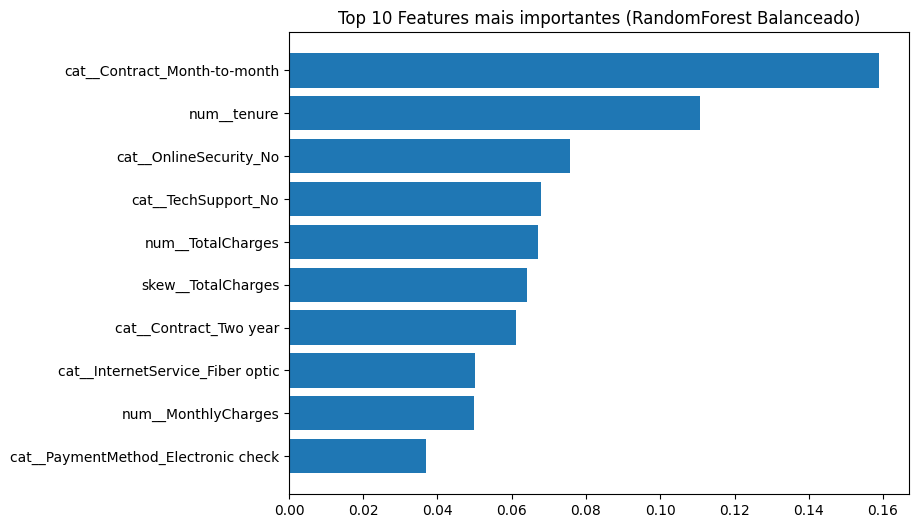

In [34]:
model_rf = rf_optuna_balanced_model.named_steps['random_forest']
preprocessor_rf = rf_optuna_balanced_model.named_steps['columns']

importances_rf = model_rf.feature_importances_
feature_names_rf = preprocessor_rf.get_feature_names_out()

features_rf_df = pd.DataFrame({
    'feature': feature_names_rf,
    'importance': importances_rf
})

features_rf_df = features_rf_df.sort_values(by='importance', ascending=False)

top10_rf = features_rf_df.head(10)

plt.figure(figsize=(8, 6))
plt.barh(top10_rf['feature'], top10_rf['importance'])
plt.gca().invert_yaxis()
plt.title('Top 10 Features mais importantes (RandomForest Balanceado)')
plt.show()

In [47]:
import optuna.visualization as vis
display(vis.plot_param_importances(study_rf))
display(vis.plot_optimization_history(study_rf))
fig = optuna.visualization.plot_optimization_history(study_rf)
fig.show(renderer="notebook")

# XGBoost

O XGBoost é derivado do Gradient Boosting, um modelo que otimiza novas árvores de decisão com base em árvores anteriores. Esse modelo tem muitos hyperparametros, por esse motivo não vou utilizar GridSearch, o qual testa todas as possibilidades possíveis pois teria um custo muito alto.

Também não irei utilizar RandomizedSearch, que assim como GridSearch procura os melhores hyperparametros, porém o RandomizedSearch faz testes com valores aleatórios dentre o conjunto de possíveis valores. É mais eficiente que o GridSearch porém ainda pode gastar muitos recursos computacionais

Irei utilizar Bayesian Optimization com Optuna, um método que acha o subconjunto dos melhores hyperparametros baseado em resultados anteriores e no teorema de Bayes. Além disso o Optuna é uma biblioteca moderna que tem vários pontos positivos: é rápida e eficiente, escalável, prunning automático e também traz um código mais limpo.

In [36]:
import xgboost as xgb

def objective_xgb(trial):
  hyper_params = {
      'n_estimators': trial.suggest_int('n_estimators', 50, 1000),
      'max_depth': trial.suggest_int('max_depth', 3, 10),
      'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
      'subsample': trial.suggest_float('subsample', 0.3, 1),
      'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
      'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1),
      'gamma' : trial.suggest_float('gamma', 0, 5)
  }

  xgb_model = xgb.XGBClassifier(
      **hyper_params,
      objective = 'binary:logistic',
      eval_metric='auc',
      n_jobs = -1,
      random_state=42
      )

  pipeline = Pipeline([
      ('columns', columns_pipe),
      ('xgb', xgb_model)
  ])

  score = cross_val_score(pipeline, X_train, y_train, cv = 5, scoring = 'roc_auc')
  return score.mean()



study_xgb = optuna.create_study(study_name = 'XGBoost_Churn', direction='maximize')
study_xgb.optimize(objective_xgb, n_trials=20, show_progress_bar=True, n_jobs = 1)

best_params = study_xgb.best_params
print(f'\nMelhores hiperparametros: {best_params}')

[I 2026-02-20 00:14:28,627] A new study created in memory with name: XGBoost_Churn


  0%|          | 0/20 [00:00<?, ?it/s]

[I 2026-02-20 00:14:47,230] Trial 0 finished with value: 0.8460077924456954 and parameters: {'n_estimators': 884, 'max_depth': 9, 'learning_rate': 0.1801777373454221, 'subsample': 0.6110179819519155, 'min_child_weight': 7, 'colsample_bytree': 0.586816869332287, 'gamma': 3.72749501547067}. Best is trial 0 with value: 0.8460077924456954.
[I 2026-02-20 00:14:55,135] Trial 1 finished with value: 0.8478725776975787 and parameters: {'n_estimators': 634, 'max_depth': 9, 'learning_rate': 0.1875301477739563, 'subsample': 0.7917612965172423, 'min_child_weight': 9, 'colsample_bytree': 0.47515395180424225, 'gamma': 2.675872658080805}. Best is trial 1 with value: 0.8478725776975787.
[I 2026-02-20 00:14:57,044] Trial 2 finished with value: 0.8227033937877664 and parameters: {'n_estimators': 294, 'max_depth': 5, 'learning_rate': 0.13482853986905663, 'subsample': 0.3569582155263591, 'min_child_weight': 1, 'colsample_bytree': 0.6730767314957189, 'gamma': 1.8465030609524224}. Best is trial 1 with value:

In [37]:
study_xgb.best_params

{'n_estimators': 810,
 'max_depth': 10,
 'learning_rate': 0.02990853683201458,
 'subsample': 0.4788255990157747,
 'min_child_weight': 10,
 'colsample_bytree': 0.9563885024380037,
 'gamma': 4.470627377488819}

In [46]:
import optuna.visualization as vis
display(vis.plot_param_importances(study_xgb))
display(vis.plot_optimization_history(study_xgb))
fig = optuna.visualization.plot_optimization_history(study_xgb)
fig.show(renderer="notebook")

Esses gráficos do Optuna mostram que o modelo flutuava perto de um valor bom e precisou apenas de um pequeno ajuste. Também mostrou que os hiperparametros mais importantes foram: taxa de aprendizado, gamma e a amostra de coluna por árvore.

In [39]:
xgb_model = Pipeline([
    ('columns', columns_pipe),
    ('xgb', xgb.XGBClassifier(
        n_estimators = 950,
        max_depth= 3,
        learning_rate = 0.1286906756131108,
        subsample = 0.8117250941636349,
        min_child_weight = 1,
        colsample_bytree = 0.3784953835369552,
        gamma = 4.0688900435740045))
])

xgb_model.fit(X_train, y_train)
y_xgb_pred = xgb_model.predict(X_test)
y_xgb_proba = xgb_model.predict_proba(X_test)[:,1]
print(classification_report(y_test, y_xgb_pred))
print(f'ROC AUC {roc_auc_score(y_test, y_xgb_proba):.4f}')

              precision    recall  f1-score   support

           0       0.84      0.90      0.87      1552
           1       0.65      0.51      0.57       561

    accuracy                           0.80      2113
   macro avg       0.74      0.71      0.72      2113
weighted avg       0.79      0.80      0.79      2113

ROC AUC 0.8453


Como o resultado desse XGBoost foi inferior ao recall do baseline irei utilizar rodar novamente o Optune e o XGBoost porém agora utilizando o hiperparamero 'scale_pos_weight' pois esse desempenho abaixo do esperado provavelmente é por causa do desbalanceamento das classes alvo.

In [40]:
import xgboost as xgb
import optuna
from sklearn.model_selection import cross_val_score

ratio = float(np.sum(y_train == 0)) / np.sum(y_train == 1)
print(f'Ratio calculado: {ratio:.2f}')

def objective_xgb_scale(trial):
  hyper_params = {
      'n_estimators': trial.suggest_int('n_estimators', 50, 1000),
      'max_depth': trial.suggest_int('max_depth', 3, 10),
      'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
      'subsample': trial.suggest_float('subsample', 0.3, 1),
      'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
      'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1),
      'gamma' : trial.suggest_float('gamma', 0, 5),
      'scale_pos_weight': trial.suggest_float('scale_pos_weight', ratio, ratio * 2)
  }

  xgb_model = xgb.XGBClassifier(
      **hyper_params,
      objective = 'binary:logistic',
      eval_metric='auc',
      n_jobs = -1,
      random_state=42
      )

  pipeline = Pipeline([
      ('columns', columns_pipe),
      ('xgb', xgb_model)
  ])

  score = cross_val_score(pipeline, X_train, y_train, cv = 5, scoring = 'roc_auc')
  return score.mean()

study_xgb_scale = optuna.create_study(study_name = 'XGBoost_Churn', direction='maximize')
study_xgb_scale.optimize(objective_xgb_scale, n_trials=20, show_progress_bar=True, n_jobs=1)

best_params = study_xgb_scale.best_params
print(f'\nMelhores hiperparametros: {best_params}')

[I 2026-02-20 00:15:46,651] A new study created in memory with name: XGBoost_Churn


Ratio calculado: 2.77


  0%|          | 0/20 [00:00<?, ?it/s]

[I 2026-02-20 00:15:52,847] Trial 0 finished with value: 0.8339599780399418 and parameters: {'n_estimators': 470, 'max_depth': 5, 'learning_rate': 0.057993206838002326, 'subsample': 0.5643550566125382, 'min_child_weight': 3, 'colsample_bytree': 0.5585305960067366, 'gamma': 1.037643959443975, 'scale_pos_weight': 3.2323914455935414}. Best is trial 0 with value: 0.8339599780399418.
[I 2026-02-20 00:15:54,907] Trial 1 finished with value: 0.83505187138935 and parameters: {'n_estimators': 351, 'max_depth': 4, 'learning_rate': 0.09770517868535841, 'subsample': 0.3806266843356879, 'min_child_weight': 1, 'colsample_bytree': 0.8387475820258428, 'gamma': 3.9423589860945434, 'scale_pos_weight': 3.4458254413382594}. Best is trial 1 with value: 0.83505187138935.
[I 2026-02-20 00:15:57,253] Trial 2 finished with value: 0.8418632219557745 and parameters: {'n_estimators': 728, 'max_depth': 9, 'learning_rate': 0.16449399908123716, 'subsample': 0.8288683523812375, 'min_child_weight': 10, 'colsample_bytr

In [41]:
xgb_scale_model = Pipeline([
    ('columns', columns_pipe),
    ('xgb', xgb.XGBClassifier(
        n_estimators = 95,
        max_depth= 5,
        learning_rate = 0.03233089252389295,
        subsample = 0.9224293836836541,
        min_child_weight = 7,
        colsample_bytree = 0.7824075858733704,
        gamma = 0.46721218111483276,
        scale_pos_weight = 4.350861523208348))
])

xgb_scale_model.fit(X_train, y_train)
y_xgb_scale_pred = xgb_scale_model.predict(X_test)
y_xgb_scale_proba = xgb_scale_model.predict_proba(X_test)[:,1]
print('\n' + '=' * 50)
print('XGBoost with Optuna and scale_pos_weight')
print('=' * 50)
print(classification_report(y_test, y_xgb_scale_pred))
print(f'ROC AUC {roc_auc_score(y_test, y_xgb_scale_proba):.4f}')


XGBoost with Optuna and scale_pos_weight
              precision    recall  f1-score   support

           0       0.93      0.66      0.77      1552
           1       0.48      0.86      0.62       561

    accuracy                           0.71      2113
   macro avg       0.70      0.76      0.69      2113
weighted avg       0.81      0.71      0.73      2113

ROC AUC 0.8441


Agora consegui elevar o Recall de 0.52 para 0.86, um aumento de 65%!!

In [48]:
import optuna.visualization as vis
display(vis.plot_param_importances(study_xgb_scale))
display(vis.plot_optimization_history(study_xgb_scale))
fig = optuna.visualization.plot_optimization_history(study_xgb_scale)
fig.show(renderer="notebook")

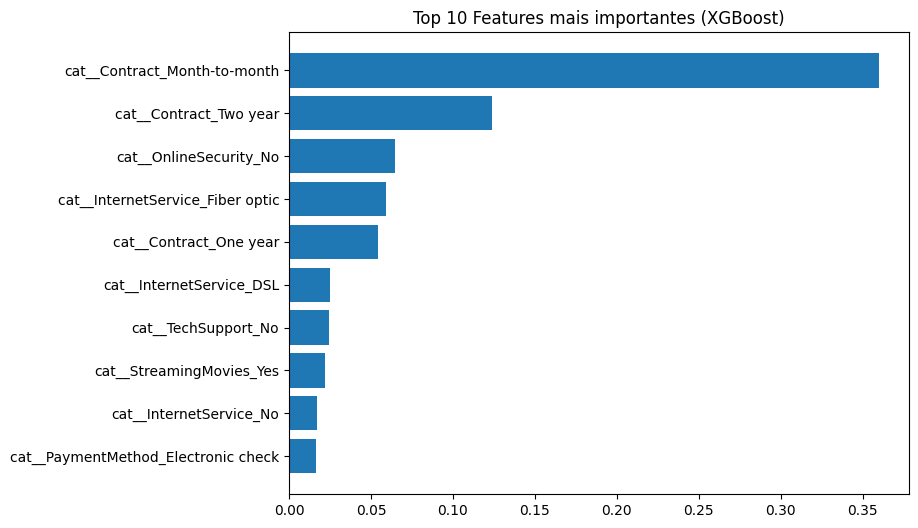

In [42]:
model_xgb = xgb_scale_model.named_steps['xgb']
preprocessor_xgb = xgb_scale_model.named_steps['columns']

importances_xgb = model_xgb.feature_importances_
feature_names_xgb = preprocessor_xgb.get_feature_names_out()

features_xgb_df = pd.DataFrame({
    'feature': feature_names_xgb,
    'importance': importances_xgb
})

features_xgb_df = features_xgb_df.sort_values(by='importance', ascending=False)

top10_xgb = features_xgb_df.head(10)

plt.figure(figsize=(8, 6))
plt.barh(top10_xgb['feature'], top10_xgb['importance'])
plt.gca().invert_yaxis()
plt.title('Top 10 Features mais importantes (XGBoost)')
plt.show()

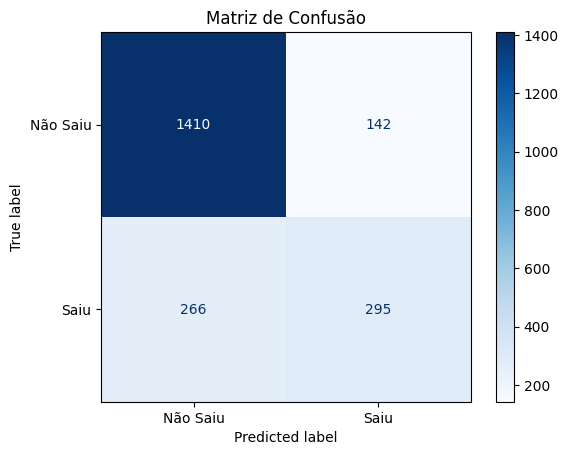

Detectamos 295 dos 561 clientes que sairiam.
Porém, foram enviadas 142 promoções para alarmes falsos


In [43]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Não Saiu', 'Saiu'])
disp.plot(cmap='Blues')
plt.title("Matriz de Confusão")
plt.show()

print(f"Detectamos {cm[1,1]} dos {cm[1,0] + cm[1,1]} clientes que sairiam.")
print(f"Porém, foram enviadas {cm[0,1]} promoções para alarmes falsos")

In [44]:
# Features que são importantes nos 3 modelos

same_features_xgb = set(top10_xgb['feature'])
same_features_rf = set(top10_rf['feature'])
same_features_lr = set(top10_lr['feature'])

same_features = same_features_xgb & same_features_rf & same_features_lr
print(same_features)

{'cat__Contract_Month-to-month', 'cat__OnlineSecurity_No', 'cat__InternetService_Fiber optic', 'cat__TechSupport_No', 'cat__PaymentMethod_Electronic check'}


# Resultados, Business Recommendations e Conclusão

## Sobre os modelos:
Diversos modelos com configurações diferentes foram testados para analisar e proporcionar uma visão mais ampla do problema. Alguns modelos apresentaram resultados bons em métricas específicas (Ex: Xgboost com optuna e scale teve o maior Recall, 86%) enquanto outros foram mais generalistas (Ex: Regressão logística que apresentou um equilíbrio em todas as métricas).

É importante relembrar que cada situação é única, ou seja, cada caso/projeto vai ter suas especificidades baseadas nos objetivos da empresa e seus impactos. No próprio cenário de Churn o objetivo final pode gerar resultados diferentes dependendo do que a empresa precisa.

Por isso, a métrica principal dos modelos a ser avaliada muda de acordo com esse fator. Nesse caso em específico que estou simulando, trabalhei para priorizar modelos com maior recall para os clientes que realmente saíram, isso funciona bem caso os recursos gastos para manter um cliente (enviando promoções por exemplo) seja menor do que o valor a ser perdido caso aquele cliente saia.

No final, o modelo com melhores resultados foram:
  - XGBoost Scaled: Apresentou o melhor recall nos casos de Churn, útil para o caso que a empresa busca alcançar ao máximo possíveis casos de Churn mesmo que isso signifique enviar avisos para alguns clientes que não sairiam.
  - Regressão logística: Modelo com resultados mais equilibrados, tem um recall alto sem perder tanto da precisão, ROC AUC bom também.
  - Regressão logística com balanceamento: Tem um ótimo recall, melhor do que o baseline porém a precisão é inferior.



## Insights valiosos para a empresa:
De acordo com os estudos feitos nesse projeto, é possível ter uma compreensão muito melhor sobre a situação da empresa com seus clientes e trabalhar maneiras para aumentar a retenção.

Os gráficos ajudam muito nessa tarefa, dentre os resultados obtidos é crucial destacar:
  - Clientes com contratos mensais têm uma taxa de churn aproximadamente 15x maior do que clientes com contrato de dois anos.
  - Em todos os modelos a variável mais impactante foi a dos contratos mensais (gerada pelo OneHotEncoding), isso nos diz que os clientes mais propensos a saírem da empresa são exatamente os que possuem contrato mensal.
  - Algumas variáveis apareceram no top 10 variáveis mais importantes de todos os modelos, as quais são:
    - InternetService_Fiber optic
    - PaymentMethod_Electronic check
    - Contract_Month-to-month
    - TechSupport_No
    - OnlineSecurity_No
    
    Ou seja, a falta de suporte técnico e segurança online são fatores muito impactantes para os clientes, é recomendado que esse serviço seja oferecido para mais clientes como uma tentativa de diminuir possíveis Churns.
    Além disso o serviço de internet de fibra ótica e o método de pagamento por eletronic check também teve muita importância para os modelos.

    Para evitar Churn e extrair valor desse estudo, é recomendável:
      - Criar campanhas para clientes com tenure < 3
      - Oferecer desconto em contratos anuais para os clientes que já tem contratos mensais
  

## Por fim:
Esse projeto pode proporcionar um melhor entendimento do Churn, esse problema que é tão importante em todas as empresas do mundo.

Gostaria de agradecer caso você tenha lido até aqui, esta é uma maneira de tornar público todo o conhecimento que venho acumulando nos meus estudos de ciência de dados. Entre livros, cursos, aulas na faculdade e experiências, busco me aprimorar cada dia mais para demonstrar a importância da estatística, técnicas de modelagem e análises tão presentes no dia a dia de um cientista de dados.

Estarei sempre estudando para melhorar aperfeiçoar minhas habilidades!